#Deep learning based end-to-end speech recognition 


The goal of this assignment is to get familiar with applications that require speech data as input.

We would be using the torchaudio library (pip install torchaudio==0.11.0), please carefull read this tutorial https://pytorch.org/tutorials/intermediate/speech_recognition_pipeline_tutorial.html

Next, we would ask you to perform similar analysis on a speech dataset, i.e., speechdata.zip. Unzip this folder, you would see a folder named wavs, and a file called "labels.csv", containing annotated transcripts, including the files in the wavs folder (you have more labels in labels.csv). This dataset is selected from https://keithito.com/LJ-Speech-Dataset/, a famous speech-based application benchmark.

General torchaudio tutorials: https://pytorch.org/tutorials/index.html

##Download Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip /content/drive/MyDrive/Dataset/Data_Analytics/speechdata.zip

Archive:  /content/drive/MyDrive/Dataset/Data_Analytics/speechdata.zip
  inflating: labels.csv              
  inflating: __MACOSX/._labels.csv   
   creating: wavs/
  inflating: __MACOSX/._wavs         
  inflating: wavs/LJ001-0048.wav     
  inflating: __MACOSX/wavs/._LJ001-0048.wav  
  inflating: wavs/LJ001-0060.wav     
  inflating: __MACOSX/wavs/._LJ001-0060.wav  
  inflating: wavs/LJ001-0074.wav     
  inflating: __MACOSX/wavs/._LJ001-0074.wav  
  inflating: wavs/LJ001-0100.wav     
  inflating: __MACOSX/wavs/._LJ001-0100.wav  
  inflating: wavs/LJ001-0075.wav     
  inflating: __MACOSX/wavs/._LJ001-0075.wav  
  inflating: wavs/LJ001-0061.wav     
  inflating: __MACOSX/wavs/._LJ001-0061.wav  
  inflating: wavs/LJ001-0049.wav     
  inflating: __MACOSX/wavs/._LJ001-0049.wav  
  inflating: wavs/LJ001-0077.wav     
  inflating: __MACOSX/wavs/._LJ001-0077.wav  
  inflating: wavs/LJ001-0063.wav     
  inflating: __MACOSX/wavs/._LJ001-0063.wav  
  inflating: wavs/LJ001-0088.wav     
  

# Task 1: Data exploration
Select one randomly sampled wav file in the given folder, perform the following analysis:

1) Print the shape of the picked waveform

2) Print the sample rate of the waveform. 

3) Visualize the waveform using matplotlib

4) Create the spectrogram representation of the picked waveform and visualize it. 

5) Create the MFCC representation of the picked waveform and visualize it.

Reference: https://www.kaggle.com/code/davids1992/speech-representation-and-data-exploration/notebook 

### Select one randomly sampled wav file in the given folder

In [ ]:
#save the path of the random file in speech_file_sample variable
speech_file_sample = "/content/wavs/LJ001-0008.wav"
print(speech_file_sample)

/content/wavs/LJ001-0008.wav


### Print the shape of the picked waveform

In [ ]:
import torch
import torchaudio

In [ ]:
torch.random.manual_seed(0)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(torch.__version__)
print(torchaudio.__version__)
print(device)

1.13.0+cu116
0.13.0+cu116
cpu


In [ ]:
waveform, sample_rate = torchaudio.load(speech_file_sample)
print("Shape of the picked wave >>>>> ",(waveform.size()))

Shape of the picked wave >>>>>  torch.Size([1, 39325])


###Print the sample rate of the waveform.

In [ ]:
print("Sample rate of the picked wave >>>>> ",(sample_rate))

Sample rate of the picked wave >>>>>  22050


### Display the picked waveform

In [ ]:
from IPython.display import Audio 
from IPython.core.display import display

In [ ]:
display(Audio(speech_file_sample, autoplay=True))

### Visualize the waveform using matplotlib

In [ ]:
import matplotlib.pyplot as plt

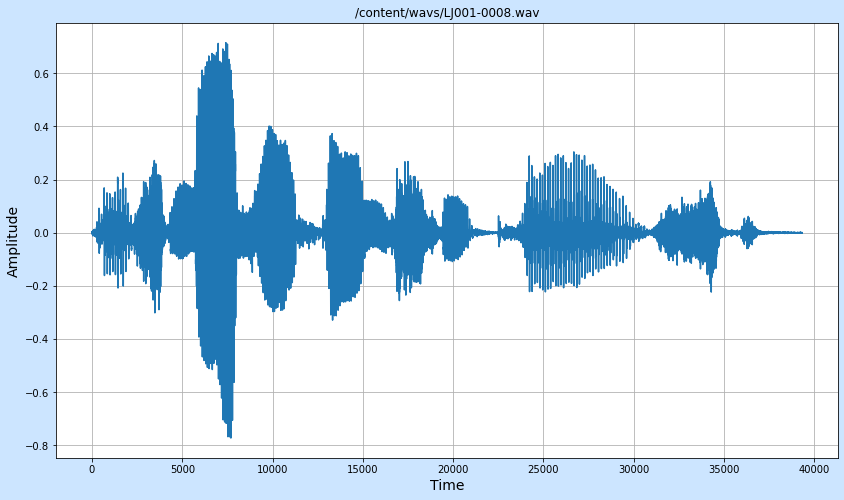

In [ ]:
plt.figure(figsize=(14, 8), facecolor='#CCE5FF')
plt.grid(True)
plt.title(speech_file_sample)
plt.ylabel('Amplitude', fontsize=14)
plt.xlabel('Time', fontsize=14)
plt.plot(waveform.t().numpy())

### Create the spectrogram representation of the picked waveform and visualize it.

In [ ]:
import scipy.io.wavfile as wavfile
from scipy import signal
import numpy as np

In [ ]:
sample_rate, samples = wavfile.read(speech_file_sample)

In [ ]:
# Define a function that calculates spectrogram.
def log_specgram(audio, sample_rate, window_size=20, step_size=10, eps=1e-10):
    nperseg = int(round(window_size * sample_rate / 1e3))
    noverlap = int(round(step_size * sample_rate / 1e3))
    freqs, times, spec = signal.spectrogram(audio, fs=sample_rate, window='hann', nperseg=nperseg, noverlap=noverlap, detrend=False)
    
    return freqs, times, np.log(spec.T.astype(np.float32) + eps)

In [ ]:
freqs, times, spectrogram = log_specgram(samples, sample_rate)

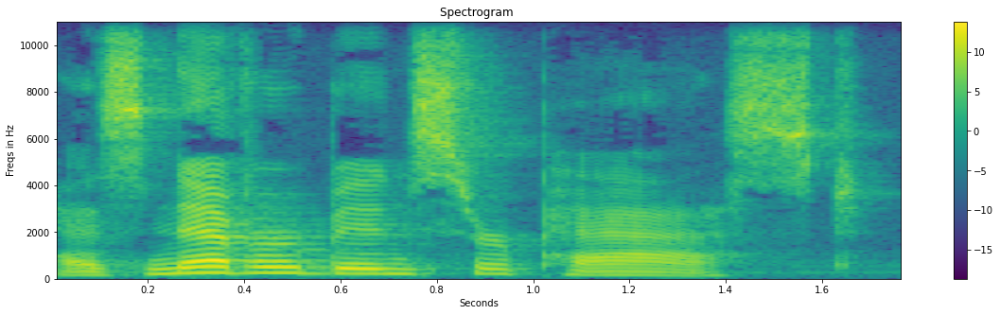

In [ ]:
plt.figure(figsize=(20, 5))
plt.imshow(spectrogram.T, aspect='auto', origin='lower', extent=[times.min(), times.max(), freqs.min(), freqs.max()])
plt.title('Spectrogram ' )
plt.ylabel('Freqs in Hz')
plt.xlabel('Seconds')
plt.colorbar()
plt.show()

### Create the MFCC representation of the picked waveform and visualize it.

In [ ]:
import librosa
import librosa.display

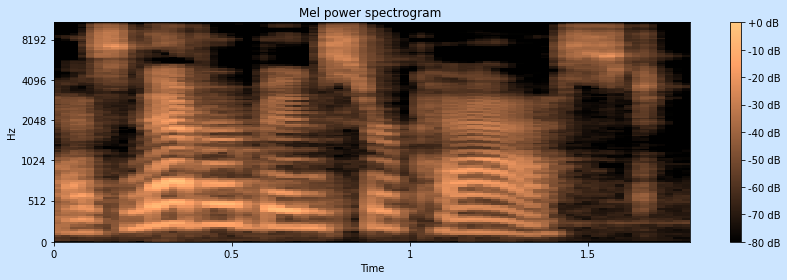

In [ ]:
## https://github.com/librosa/librosa/blob/master/examples/LibROSA%20demo.ipynb
samples, sample_rate = librosa.load(speech_file_sample)
S = librosa.feature.melspectrogram(samples, sr=sample_rate, n_mels=128)

# Convert to log scale (dB). We'll use the peak power (max) as reference.
log_S = librosa.power_to_db(S, ref=np.max)

plt.figure(figsize=(12, 4), facecolor='#CCE5FF')
librosa.display.specshow(log_S, sr=sample_rate, x_axis='time', y_axis='mel', cmap = 'copper')
plt.title('Mel power spectrogram ')
plt.colorbar(format='%+02.0f dB')
plt.tight_layout()

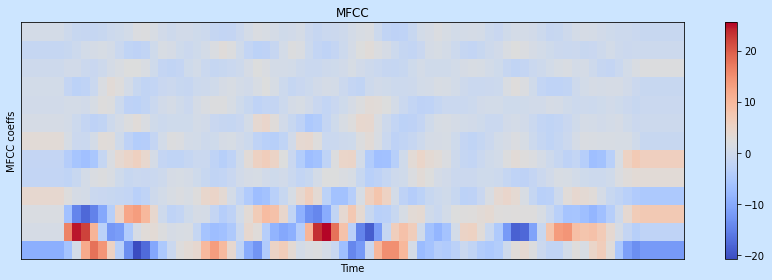

In [ ]:
mfcc = librosa.feature.mfcc(S=log_S, n_mfcc=13)

# Let's pad on the first and second deltas while we're at it
delta2_mfcc = librosa.feature.delta(mfcc, order=2)

plt.figure(figsize=(12, 4), facecolor='#CCE5FF')
librosa.display.specshow(delta2_mfcc)
plt.ylabel('MFCC coeffs')
plt.xlabel('Time')
plt.title('MFCC')
plt.colorbar()
plt.tight_layout()

# Task 2: Creating a Wav2Vec2 model that can perform feature extraction and classification.


In [ ]:
#https://pytorch.org/tutorials/intermediate/speech_recognition_pipeline_tutorial.html
bundle = torchaudio.pipelines.WAV2VEC2_ASR_BASE_960H

print("Sample Rate:", bundle.sample_rate)

print("Labels:", bundle.get_labels())

Sample Rate: 16000
Labels: ('-', '|', 'E', 'T', 'A', 'O', 'N', 'I', 'H', 'S', 'R', 'D', 'L', 'U', 'M', 'W', 'C', 'F', 'G', 'Y', 'P', 'B', 'V', 'K', "'", 'X', 'J', 'Q', 'Z')


In [ ]:
bundle

Wav2Vec2ASRBundle(_path='wav2vec2_fairseq_base_ls960_asr_ls960.pth', _params={'extractor_mode': 'group_norm', 'extractor_conv_layer_config': [(512, 10, 5), (512, 3, 2), (512, 3, 2), (512, 3, 2), (512, 3, 2), (512, 2, 2), (512, 2, 2)], 'extractor_conv_bias': False, 'encoder_embed_dim': 768, 'encoder_projection_dropout': 0.1, 'encoder_pos_conv_kernel': 128, 'encoder_pos_conv_groups': 16, 'encoder_num_layers': 12, 'encoder_num_heads': 12, 'encoder_attention_dropout': 0.1, 'encoder_ff_interm_features': 3072, 'encoder_ff_interm_dropout': 0.0, 'encoder_dropout': 0.1, 'encoder_layer_norm_first': False, 'encoder_layer_drop': 0.05, 'aux_num_out': 29}, _sample_rate=16000, _labels=('|', 'E', 'T', 'A', 'O', 'N', 'I', 'H', 'S', 'R', 'D', 'L', 'U', 'M', 'W', 'C', 'F', 'G', 'Y', 'P', 'B', 'V', 'K', "'", 'X', 'J', 'Q', 'Z'), _remove_aux_axis=(1, 2, 3))

In [ ]:
# fetch the pre-trained weights and load it into the model.
model = bundle.get_model().to(device)

print(model.__class__)

Downloading: "https://download.pytorch.org/torchaudio/models/wav2vec2_fairseq_base_ls960_asr_ls960.pth" to /root/.cache/torch/hub/checkpoints/wav2vec2_fairseq_base_ls960_asr_ls960.pth


  0%|          | 0.00/360M [00:00<?, ?B/s]

<class 'torchaudio.models.wav2vec2.model.Wav2Vec2Model'>


In [ ]:
model

Wav2Vec2Model(
  (feature_extractor): FeatureExtractor(
    (conv_layers): ModuleList(
      (0): ConvLayerBlock(
        (layer_norm): GroupNorm(512, 512, eps=1e-05, affine=True)
        (conv): Conv1d(1, 512, kernel_size=(10,), stride=(5,), bias=False)
      )
      (1): ConvLayerBlock(
        (conv): Conv1d(512, 512, kernel_size=(3,), stride=(2,), bias=False)
      )
      (2): ConvLayerBlock(
        (conv): Conv1d(512, 512, kernel_size=(3,), stride=(2,), bias=False)
      )
      (3): ConvLayerBlock(
        (conv): Conv1d(512, 512, kernel_size=(3,), stride=(2,), bias=False)
      )
      (4): ConvLayerBlock(
        (conv): Conv1d(512, 512, kernel_size=(3,), stride=(2,), bias=False)
      )
      (5): ConvLayerBlock(
        (conv): Conv1d(512, 512, kernel_size=(2,), stride=(2,), bias=False)
      )
      (6): ConvLayerBlock(
        (conv): Conv1d(512, 512, kernel_size=(2,), stride=(2,), bias=False)
      )
    )
  )
  (encoder): Encoder(
    (feature_projection): FeatureProjec

# Feature extraction and classification and Generating transcripts from one sample




In [ ]:
waveform, sample_rate = torchaudio.load(speech_file_sample)
waveform = waveform.to(device)

In [ ]:
#If the sampling rate is different from what the pipeline expects, then we can use torchaudio.functional.resample() for resampling.
if sample_rate != bundle.sample_rate:
    waveform = torchaudio.functional.resample(waveform, sample_rate, bundle.sample_rate)

In [ ]:
with torch.inference_mode():
    features, _ = model.extract_features(waveform)

In [ ]:
features

[tensor([[[-0.0429,  0.1014, -0.3018,  ...,  0.1444, -0.0418, -0.6340],
          [-0.0512,  0.2029, -0.1683,  ..., -0.3492, -0.2266, -0.3377],
          [ 0.1466,  0.1392, -0.2075,  ..., -0.4923, -0.1271, -0.3486],
          ...,
          [-0.1340,  0.2295,  0.0787,  ...,  0.1609,  0.1855,  0.0652],
          [-0.1999,  0.3760,  0.0628,  ...,  0.1392,  0.2364,  0.0836],
          [-0.1523,  0.4156,  0.1199,  ..., -0.0711,  0.0789, -0.0285]]]),
 tensor([[[-0.2282,  0.0067, -0.0271,  ...,  0.1827, -0.2060, -0.2825],
          [-0.0649,  0.1814, -0.0028,  ..., -0.2654, -0.0949, -0.2131],
          [ 0.0284,  0.2576, -0.0368,  ..., -0.2678, -0.0420, -0.1177],
          ...,
          [ 0.0396, -0.1888,  0.0699,  ...,  0.0504,  0.0031,  0.1705],
          [ 0.0920,  0.0637,  0.0336,  ...,  0.1150, -0.0844,  0.1307],
          [-0.0160,  0.1105,  0.0739,  ...,  0.0304, -0.1540,  0.1731]]]),
 tensor([[[-0.2043,  0.3302, -0.1064,  ...,  0.0289, -0.1376, -0.0957],
          [-0.0408,  0.2720,

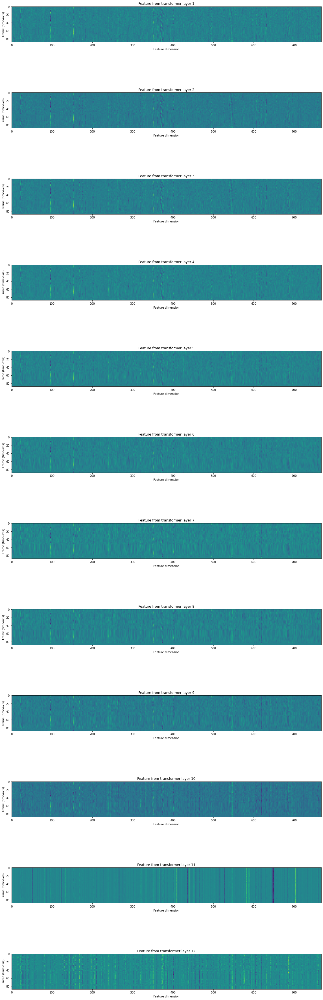

In [ ]:
#The returned features is a list of tensors. Each tensor is the output of a transformer layer.
fig, ax = plt.subplots(len(features), 1, figsize=(16, 4.3 * len(features)))
for i, feats in enumerate(features):
    ax[i].imshow(feats[0].cpu())
    ax[i].set_title(f"Feature from transformer layer {i+1}")
    ax[i].set_xlabel("Feature dimension")
    ax[i].set_ylabel("Frame (time-axis)")
plt.tight_layout()
plt.show()

In [ ]:
#Feature classification
#Once the acoustic features are extracted, the next step is to classify them into a set of categories
with torch.inference_mode():
    emission, _ = model(waveform)

In [ ]:
 emission

tensor([[[ 12.8177,   0.6530,  -0.1015,  ...,  -9.7091, -11.9705,  -9.5910],
         [  7.8587,  -1.6813,  -0.6131,  ...,  -5.0621,  -9.7042,  -5.0397],
         [ 15.5066,   3.3703,   2.2091,  ...,  -8.9197, -12.5758,  -8.8039],
         ...,
         [ 16.5979,   0.1474,  -3.5519,  ...,  -9.4870, -10.9995, -10.2278],
         [ 14.3841,   0.2306,  -1.5264,  ...,  -8.5333,  -9.4915,  -8.8889],
         [ 16.4576,   0.1801,  -3.4202,  ...,  -9.5049, -11.0380, -10.1240]]])

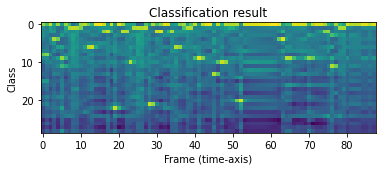

Class labels: ('-', '|', 'E', 'T', 'A', 'O', 'N', 'I', 'H', 'S', 'R', 'D', 'L', 'U', 'M', 'W', 'C', 'F', 'G', 'Y', 'P', 'B', 'V', 'K', "'", 'X', 'J', 'Q', 'Z')


In [ ]:
plt.imshow(emission[0].cpu().T)
plt.title("Classification result")
plt.xlabel("Frame (time-axis)")
plt.ylabel("Class")
plt.show()
print("Class labels:", bundle.get_labels())

Generating transcripts

In [ ]:
class GreedyCTCDecoder(torch.nn.Module):
    def __init__(self, labels, blank=0):
        super().__init__()
        self.labels = labels
        self.blank = blank

    def forward(self, emission: torch.Tensor) -> str:
        """Given a sequence emission over labels, get the best path string
        Args:
          emission (Tensor): Logit tensors. Shape `[num_seq, num_label]`.

        Returns:
          str: The resulting transcript
        """
        indices = torch.argmax(emission, dim=-1)  # [num_seq,]
        indices = torch.unique_consecutive(indices, dim=-1)
        indices = [i for i in indices if i != self.blank]
        return "".join([self.labels[i] for i in indices])

In [ ]:
decoder = GreedyCTCDecoder(labels=bundle.get_labels())
transcript = decoder(emission[0])

In [ ]:
print(transcript)
Audio(speech_file_sample)
#from IPython.display import Audio

HAS|NEVER|BEEN|SURPASSED|


# Task 3: Extract acoustic features and generate predicted transcript for each waveform in the given dataset

In [ ]:
speech_file_path = "/content/wavs"
print(speech_file_path)

/content/wavs


In [ ]:
from os import listdir
from os.path import isfile, join

In [ ]:
speech_file_path_list = [f for f in listdir(speech_file_path) if isfile(join(speech_file_path, f))]

In [ ]:
speech_file_path_list

['LJ001-0093.wav',
 'LJ001-0092.wav',
 'LJ001-0045.wav',
 'LJ001-0033.wav',
 'LJ001-0078.wav',
 'LJ001-0038.wav',
 'LJ001-0024.wav',
 'LJ001-0084.wav',
 'LJ001-0039.wav',
 'LJ001-0098.wav',
 'LJ001-0097.wav',
 'LJ001-0006.wav',
 'LJ001-0030.wav',
 'LJ001-0057.wav',
 'LJ001-0014.wav',
 'LJ001-0067.wav',
 'LJ001-0035.wav',
 'LJ001-0069.wav',
 'LJ001-0010.wav',
 'LJ001-0022.wav',
 'LJ001-0099.wav',
 'LJ001-0096.wav',
 'LJ001-0041.wav',
 'LJ001-0028.wav',
 'LJ001-0064.wav',
 'LJ001-0061.wav',
 'LJ001-0012.wav',
 'LJ001-0071.wav',
 'LJ001-0062.wav',
 'LJ001-0001.wav',
 'LJ001-0013.wav',
 'LJ001-0029.wav',
 'LJ001-0007.wav',
 'LJ001-0094.wav',
 'LJ001-0050.wav',
 'LJ001-0031.wav',
 'LJ001-0077.wav',
 'LJ001-0056.wav',
 'LJ001-0100.wav',
 'LJ001-0043.wav',
 'LJ001-0060.wav',
 'LJ001-0081.wav',
 'LJ001-0086.wav',
 'LJ001-0002.wav',
 'LJ001-0072.wav',
 'LJ001-0065.wav',
 'LJ001-0009.wav',
 'LJ001-0083.wav',
 'LJ001-0048.wav',
 'LJ001-0051.wav',
 'LJ001-0091.wav',
 'LJ001-0068.wav',
 'LJ001-0008

In [ ]:
len(speech_file_path_list)

101

In [ ]:
speech_file_path_list_copy=speech_file_path_list

In [ ]:
import re

In [ ]:
#remove any wrong file path
for f in range(len(speech_file_path_list_copy)):
  w=re.match('^(?!.*[.]wav$).*$',speech_file_path_list_copy[f])
  if w:
    del speech_file_path_list[f]

In [ ]:
len(speech_file_path_list)

100

In [ ]:
speech_file_path_list

['LJ001-0093.wav',
 'LJ001-0092.wav',
 'LJ001-0045.wav',
 'LJ001-0033.wav',
 'LJ001-0078.wav',
 'LJ001-0038.wav',
 'LJ001-0024.wav',
 'LJ001-0084.wav',
 'LJ001-0039.wav',
 'LJ001-0098.wav',
 'LJ001-0097.wav',
 'LJ001-0006.wav',
 'LJ001-0030.wav',
 'LJ001-0057.wav',
 'LJ001-0014.wav',
 'LJ001-0067.wav',
 'LJ001-0035.wav',
 'LJ001-0069.wav',
 'LJ001-0010.wav',
 'LJ001-0022.wav',
 'LJ001-0099.wav',
 'LJ001-0096.wav',
 'LJ001-0041.wav',
 'LJ001-0028.wav',
 'LJ001-0064.wav',
 'LJ001-0061.wav',
 'LJ001-0012.wav',
 'LJ001-0071.wav',
 'LJ001-0062.wav',
 'LJ001-0001.wav',
 'LJ001-0013.wav',
 'LJ001-0029.wav',
 'LJ001-0007.wav',
 'LJ001-0094.wav',
 'LJ001-0050.wav',
 'LJ001-0031.wav',
 'LJ001-0077.wav',
 'LJ001-0056.wav',
 'LJ001-0100.wav',
 'LJ001-0043.wav',
 'LJ001-0060.wav',
 'LJ001-0081.wav',
 'LJ001-0086.wav',
 'LJ001-0002.wav',
 'LJ001-0072.wav',
 'LJ001-0065.wav',
 'LJ001-0009.wav',
 'LJ001-0083.wav',
 'LJ001-0048.wav',
 'LJ001-0051.wav',
 'LJ001-0091.wav',
 'LJ001-0068.wav',
 'LJ001-0008

In [ ]:
transcript_list=[]

In [ ]:
for f in speech_file_path_list:
  waveform, sample_rate = torchaudio.load('/content/wavs/'+f)
  print("__________________________________________________________________________________________________________________________\n")
  print("<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ",f," >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>")
  waveform = waveform.to(device)
  #If the sampling rate is different from what the pipeline expects, then we can use torchaudio.functional.resample() for resampling.
  if sample_rate != bundle.sample_rate:
    waveform = torchaudio.functional.resample(waveform, sample_rate, bundle.sample_rate)
  with torch.inference_mode():
    features, _ = model.extract_features(waveform)
  #Feature classification
  #Once the acoustic features are extracted, the next step is to classify them into a set of categories
  with torch.inference_mode():
      emission, _ = model(waveform)
  decoder = GreedyCTCDecoder(labels=bundle.get_labels())
  transcript = decoder(emission[0])
  transcript_list.append(transcript)
  display(Audio(speech_file_sample, autoplay=False))
  print("transcript >>>>> ",transcript)
  Audio(speech_file_sample)



__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0093.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  THIS|EXPERIMENT|WAS|SO|FAR|SUCCESSFUL|THAT|ABOUT|EIGHTEEN|FIFTY|MEZZURS|MILLER|AND|RICHARD|OF|EDINBURGH|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0092.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  THE|CHISWICK|PRESS|IN|EIGHTEEN|FORTY|FOUR|REVIVED|CASLON'S|FOUNCS|PRINTING|FOR|MESERS|LONGMIM|THE|DIARY|OF|LADY|WILLOUGHBY|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0045.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  FOURTEEN|SIXTY|NINE|FOURTEEN|SEVENTY|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0033.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  BUT|WHICH|MUST|CERTAINLY|HAVE|COME|FROM|THE|STUDY|OF|THE|TWELFTH|OR|EVEN|THE|ELEVENTH|CENTURY|M|S|S|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0078.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  TO|IMPROVE|THE|LETTER|IN|FORM|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0038.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  WHILE|IN|FOURTEEN|SEVENTY|AT|PARIS|UDORICH|GERRING|AND|HIS|ASSOCIATES|TURNED|OUT|THE|FIRST|BOOKS|PRINTED|IN|FRANCE|ALSO|IN|ROME|IN|CHARACTER|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0024.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  BUT|THE|FIRST|BIBLE|ACTUALLY|DATED|WHICH|ALSO|WAS|PRINTED|AT|MATES|BY|PETER|CHOFFER|IN|THE|YEAR|FOURTEEN|SIXTY|TWO|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0084.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  BUT|FOR|THE|BEAUTY|OF|THE|EARLIER|WORK|THEY|MIGHT|HAVE|SEEMED|TOLERABLE|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0039.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  THE|ROMAN|TYPE|OF|ALL|THESE|PRINTERS|IS|SIMILAR|IN|CHARACTER|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0098.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  AND|THE|WHOLE|EFFECT|IS|A|LITTLE|TOO|GREY|OWING|TO|THE|THINNESS|OF|THE|LETTERS|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0097.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  A|LITTLE|REDUCED|IN|UGLINESS|THE|DESIGN|OF|THE|LETTERS|OF|THIS|MODERN|OLD|STYLE|LEAVES|A|GOOD|DEAL|TO|BE|DESIRED|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0006.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  AND|IT|IS|WORTH|MENTION|IN|PASSING|THAT|AS|AN|EXAMPLE|OF|FINE|TYPOGRAPHY|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0030.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  A|VERY|FEW|YEARS|SAW|THE|BIRTH|OF|ROMEAN|CHARACTER|NOT|ONLY|IN|ITALY|BUT|IN|GERMANY|IN|FRANCE|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0057.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  PARMA|AND|ONE|OR|TWO|OTHER|CITIES|WHO|PRODUCED|THE|SPLENDID|EDITIONS|OF|THE|CLASSICS|WHICH|ARE|ONE|OF|THE|GREAT|GLORIES|OF|THE|PRINTER'S|ART|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0014.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  AND|IT|WAS|A|MATTER|OF|COURSE|THAT|IN|THE|MIDDLE|AGES|WHEN|THE|CRAFTSMEN|TOOK|CARE|THAT|BEAUTIFUL|FORM|SHOULD|ALWAYS|BE|A|PART|OF|THEIR|PRODUCTIONS|WHATEVER|THEY|WERE|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0067.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  IN|THE|LOW|COUNTRIES|AND|COLOGNE|WHICH|WERE|VERY|FERTILE|OF|PRINTED|BOOKS|GATHICK|WAS|THE|FAVORITE|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0035.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  THEY|DISCARDED|THIS|FOR|A|MORE|COMPLETELY|ROMAN|AND|FAR|LESS|BEAUTIFUL|LETTER|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0069.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  THIS|TYPE|WAS|INTRODUCED|INTO|ENGLAND|BY|WINKEN|DE|WORD|CAXTON'S|SUCCESSOR|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0010.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  NOW|AS|ALL|BOOKS|NOT|PRIMARILY|INTENDED|AS|PICTURE|BOOKS|CONSIST|PRINCIPALLY|OF|TYPES|COMPOSED|TO|FORM|LETTER|PRESS|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0022.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  OF|THE|MORE|FORMAL|ECCLESIASTICAL|WRITING|WHICH|OBTAINED|AT|THAT|TIME|THIS|HAS|SINCE|BEEN|CALLED|MISSILTYPE|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0099.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  IT|MUST|BE|REMEMBERED|HOWEVER|THAT|MOST|MODERN|PRINTING|IS|DONE|BY|MACHINERY|ON|SOFT|PAPER|AND|NOT|BY|THE|HAND|PRESS|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0096.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  HAVE|NOW|COME|INTO|GENERAL|USE|AND|ARE|OBVIOUSLY|A|GREAT|IMPROVEMENT|ON|THE|ORDINARY|MODERN|STYLE|IN|USE|IN|ENGLAND|WHICH|IS|IN|FACT|THE|BODONI|TYPE|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0041.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  IT|MUST|BE|SAID|THAT|IT|IS|IN|NO|WAY|LIKE|THE|TRANSITION|TYPE|OF|SUBIACO|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0028.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  BUT|BY|PRINTERS|IN|STRASBURG|BESEL|PARIS|LUBEC|AND|OTHER|CITIES|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0064.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  MANY|OF|WHOSE|TYPES|INDEED|LIKE|THAT|OF|THE|SOUBIACO|WORKS|ARE|OF|A|TRANSITIONAL|CHARACTER|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0061.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  THE|ROMAN|LETTER|WAS|USED|SIDE|BY|SIDE|WITH|THE|GOTHIC|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0012.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  ESPECIALLY|AS|NO|MORE|TIME|IS|OCCUPIED|OR|COST|INCURRED|INCASTING|SETTING|OR|PRINTING|BEAUTIFUL|LETTERS|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0071.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  MOST|OF|CAXTON'S|OWN|TYPES|ARE|OF|AN|EARLIER|CHARACTER|THOUGH|THEY|ALSO|MUCH|RESEMBLE|FLEMISH|OR|COLOGNE|LETTER|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0062.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  EVEN|IN|ITALY|MOST|OF|THE|THEOLOGICAL|AND|LAW|BOOKS|WERE|PRINTED|IN|GOTHIC|LETTER|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0001.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  PRINTING|IN|THE|ONLY|SENSE|WITH|WHICH|WE|ARE|AT|PRESENT|CONCERNED|DIFFERS|FROM|MOST|IF|NOT|FROM|ALL|THE|ARTS|AND|CRAFTS|REPRESENTED|IN|THE|EXHIBITION|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0013.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  AN|IN|THE|SAME|OPERATIONS|WITH|UGLY|ONES|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0029.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  BUT|THOUGH|ON|THE|WHOLE|EXCEPT|IN|ITALY|GOTHIC|LETTER|WAS|MOST|OFTEN|USED|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0007.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  THE|EARLIEST|BOOK|PRINTED|WITH|MOVABLE|TYPES|THE|GUTTENBERG|OR|FORTY|TWO|LINE|BIBLE|OF|ABOUT|FOURTEEN|FIFTY|FIVE|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0094.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  WERE|INDUCED|TO|CUT|PUNCHES|FOR|A|SERIES|OF|OLD|STYLE|LETTERS|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0050.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  AND|THOUGH|THE|FAMOUS|FAMILY|OF|ALDOS|RESTORED|ITS|TECHNICAL|EXCELLENCE|REJECTING|BATTERED|LETTERS|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0031.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  IN|FOURTEEN|SIXTY|FIVE|SWAYNHEIM|AND|PANARCHS|BEGAN|PRINTING|IN|THE|MONASTERY|OF|SUBIACO|NEAR|ROME|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0077.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  IN|ENGLAND|ABOUT|THIS|TIME|AN|ATTEMPT|WAS|MADE|NOTABLY|BY|CASLON|WHO|STARTED|BUSINESS|IN|LONDON|AS|A|TYPE|FOUNDER|IN|SEVENTEEN|TWENTY|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0056.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  IT|WAS|THESE|GREAT|VENETIAN|PRINTERS|TOGETHER|WITH|THEIR|BRETHREN|OF|ROME|MILAN|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0100.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  AND|THESE|SOMEWHAT|WIRY|LETTERS|ARE|SUITABLE|FOR|THE|MACHINE|PROCESS|WHICH|WOULD|NOT|DO|JUSTICE|TO|LETTERS|OF|MORE|GENEROUS|DESIGN|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0043.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  FURTHER|DEVELOPMENT|OF|THE|ROMAN|LETTER|TOOK|PLACE|AT|VENICE|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0060.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  MUST|BE|UNDERSTOOD|THAT|THROUGH|THE|WHOLE|OF|THE|FIFTEENTH|AND|THE|FIRST|QUARTER|OF|THE|SIXTEENTH|CENTURIES|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0081.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  TYPE|CAST|FROM|HIS|MATRESSES|IS|STILL|IN|EVERY|DAY|USE|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0086.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  ARE|DAZZLING|AND|UNPLEASANT|TO|THE|EYE|OWING|TO|THE|CLUMSY|THICKENING|AND|VULGAR|THINNING|OF|THE|LINES|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0002.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  IN|BEING|COMPARATIVELY|MODERN|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0072.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  AFTER|THE|END|OF|THE|FIFTEENTH|CENTURY|THE|DEGRADATION|OF|PRINTING|ESPECIALLY|IN|GERMANY|AND|ITALY|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0065.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  THIS|WAS|NOTABLY|THE|CASE|WITH|THE|EARLY|WORKS|PRINTED|AT|OME|AND|IN|A|SOMEWHAT|LESSER|DEGREE|AT|AUGSBURG|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0009.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  PRINTING|THEN|FOR|OUR|PURPOSE|MAY|BE|CONSIDERED|AS|THE|ART|OF|MAKING|BOOKS|BY|MEANS|OF|MOVABLE|TYPES|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0083.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  THE|SEVENTEENTH|CENTURY|FOUNTS|WERE|BAD|RATHER|NEGATIVELY|THAN|POSITIVELY|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0048.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  HIS|LETTER|IS|ADMIRABLY|CLEAR|AND|REGULAR|BUT|AT|LEAST|AS|BEAUTIFUL|AS|ANY|OTHER|ROM|IN|TYPE|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0051.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  AND|PAYING|GREAT|ATTENTION|TO|THE|PRESS|WORK|OR|ACTUAL|PROCESS|OF|PRINTING|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0091.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  SO|FAR|AS|FINE|PRINTING|IS|CONCERNED|THOUGH|PAPER|DID|NOT|GET|TO|ITS|WORST|TILL|ABOUT|EIGHTEEN|FORTY|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0068.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  THE|CHARACTERISTIC|DUTCH|TYPE|AS|REPRESENTED|BY|THE|EXCELLENT|PRINTER|GERRADE|LIEU|IS|VERY|PRONOUNCED|AND|UNCOMPROMISING|GOTHIC|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0008.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  HAS|NEVER|BEEN|SURPASSED|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0015.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  THE|FORMS|OF|PRINTED|LETTERS|SHOULD|BE|BEAUTIFUL|AND|THAT|THEIR|ARRANGEMENT|ON|THE|PAGE|SHOULD|BE|REASONABLE|AND|A|HELP|TO|THE|SHAPELINESS|OF|THE|LETTERS|THEMSELVES|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0036.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  BUT|ABOUT|THE|SAME|YEAR|MENTELINE|AT|STRAUSBURG|BEGAN|TO|PRINT|IN|A|TYPE|WHICH|IS|DISTINCTLY|ROMAN|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0037.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  AND|THE|NEXT|YEAR|GUNTHER|ZEINER|AT|AUGSBURG|FOLLOWED|SUIT|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0095.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  THESE|AND|SIMILAR|FOUNTS|CAST|BY|THE|ABOVE|FIRM|AND|OTHERS|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0055.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  SOME|OF|WHICH|AS|E|G|THAT|OF|JACOBIS|RUBIUS|OR|JACQUES|LE|RUGE|IS|SCARCELY|DISTINGUISHABLE|FROM|HIS|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0004.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  PRODUCED|THE|BLOCK|BOOKS|WHICH|WERE|THE|IMMEDIATE|PREDECESSORS|OF|THE|TRUE|PRINTED|BOOK|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0087.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  FOR|THE|SEVENTEENTH|CENTURY|LETTERS|ARE|AT|LEAST|PURE|AND|SIMPLE|IN|LINE|THE|ITALIAN|BOUDONI|AND|THE|FRENCHMAN|DIDO|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0079.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  CASLON'S|TYPE|IS|CLEAR|AND|NEAT|AND|FAIRLY|WELL|DESIGNED|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0089.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  BUT|HIS|LETTERS|THOUGH|UNINTERESTING|AND|POOR|ARE|NOT|NEARLY|SO|GROSS|AND|VULGAR|AS|THOSE|OF|EITHER|THE|ITALIAN|OR|THE|FRENCHMAN|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0016.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  THE|MIDDLE|AGES|BROUGHT|CALIGRAPHY|TO|PERFECTION|AND|IT|WAS|NATURAL|THEREFORE|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0066.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  IN|FACT|GUNTHER|ZINER'S|FIRST|TYPE|AFTERWARDS|USED|BY|SCHUSLER|IS|REMARKABLY|LIKE|THE|TYPE|OF|THE|BEFORE|MENTIONED|SUBIACO|BOOKS|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0034.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  THEY|PRINTED|VERY|FEW|BOOKS|IN|THIS|TYPE|THREE|ONLY|BUT|IN|THEIR|VERY|FIRST|BOOKS|IN|ROME|BEGINNING|WITH|THE|YEAR|FOURTEEN|SIXTY|EIGHT|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0054.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  GENSEN|HOWEVER|HAD|MANY|CONTEMPORARIES|WHO|USED|BEAUTIFUL|TYPE|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0049.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  AFTER|HIS|DEATH|IN|THE|FOURTEEN|EIGHTIES|OR|AT|LEAST|BY|FOURTEEN|NINETY|PRINTING|IN|VENICE|HAD|DECLINED|VERY|MUCH|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0019.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  AND|WHICH|DEVELOPED|MORE|COMPLETELY|AND|SATISFACTORILY|ON|THE|SIDE|OF|THE|LOWER|CASE|THAN|THE|CAPITAL|LETTERS|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0025.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  IMITATES|A|MUCH|FREER|HAND|SIMPLER|ROUNDER|AND|LESS|SPIKY|AND|THEREFORE|FAR|PLEASANTER|AND|EASIER|TO|READ|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0080.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  HE|SEEMS|TO|HAVE|TAKEN|THE|LETTER|F|THE|ELZEVIRS|OF|THE|SEVENTEENTH|CENTURY|FOR|HIS|MODEL|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0021.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  THE|EARLIEST|BOOK|PRINTED|WITH|MOVABLE|TYPE|THE|AFFORESAID|GUTTENBERG|BIBLE|IS|PRINTED|IN|LETTERS|WHICH|ARE|AN|EXACT|IMITATION|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0047.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  OF|JENSON|IT|MUST|BE|SAID|THAT|HE|CARRIED|THE|DEVELOPMENT|OF|ROMAN|TYPE|AS|FAR|AS|IT|CAN|GO|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0005.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  THE|INVENTION|OF|MOVABLE|METAL|LETTERS|IN|THE|MIDDLE|OF|THE|FIFTEENTH|CENTURY|MAY|JUSTLY|BE|CONSIDERED|AS|THE|INVENTION|OF|THE|ART|OF|PRINTING|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0018.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  THE|FIRST|BOOKS|WERE|PRINTED|IN|BLACK|LETTER|I|E|THE|LETTER|WHICH|WAS|A|GOTHIC|DEVELOPMENT|OF|THE|ANCIENT|ROMAN|CHARACTER|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0003.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  FOR|ALTHOUGH|THE|CHINESE|TOOK|IMPRESSIONS|FROM|WOOD|BLOCKS|ENGRAVED|IN|RELIEF|FOR|CENTURIES|BEFORE|THE|WOOD|CUTTERS|OF|THE|NETHERLANDS|BY|A|SIMILAR|PROCESS|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0044.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  JOHN|OF|SPIRES|AND|HIS|BROTHER|VINDOLYN|FOLLOWED|BY|NICHOLAS|GENSON|BEGAN|TO|PRINT|IN|THAT|CITY|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0052.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  YET|THEIR|TYPE|IS|ARTISTICALLY|ON|A|MUCH|LOWER|LEVEL|THAN|GENSIN'S|AND|IN|FACT|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0053.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  THEY|MUST|BE|CONSIDERED|TO|HAVE|ENDED|THE|AGE|OF|FINE|PRINTING|IN|ITALY|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0032.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  AND|USED|AN|EXCEEDINGLY|BEAUTIFUL|TYPE|WHICH|IS|INDEED|TO|LOOK|AT|A|TRANSITION|BETWEEN|GOTHIC|AND|ROMAN|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0017.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  THAT|THE|FORMS|OF|PRINTED|LETTERS|SHOULD|FOLLOW|MORE|OR|LESS|CLOSELY|THOSE|OF|THE|WRITTEN|CHARACTER|AND|THEY|FOLLOWED|THEM|VERY|CLOSELY|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0074.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  THE|BEST|MOSTLY|FRENCH|OR|LOW|COUNTRY|WAS|NEAT|AND|CLEAR|BUT|WITHOUT|ANY|DISTINCTION|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0085.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  IT|WAS|RESERVED|FOR|THE|FOUNDERS|OF|THE|LATER|EIGHTEENTH|CENTURY|TO|PRODUCE|LETTERS|WHICH|ARE|POSITIVELY|UGLY|AND|WHICH|IT|MAY|BE|ADDED|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0058.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  AND|ARE|WORTHY|REPRESENTATIVES|OF|THE|EAGER|ENTHUSIASM|FOR|THE|REVIVED|LEARNING|OF|THAT|EPOCH|BY|FAR|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0073.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  WENT|ON|APACE|AND|BY|THE|END|OF|THE|SIXTEENTH|CENTURY|THERE|WAS|NO|REALLY|BEAUTIFUL|PRINTING|DONE|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0011.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  IT|IS|OF|THE|FIRST|IMPORTANCE|THAT|THE|LETTER|USED|SHOULD|BE|FINE|IN|FORM|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0070.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  AND|WAS|USED|THERE|WITH|VERY|LITTLE|VARIATION|ALL|THROUGH|THE|SIXTEENTH|AND|SEVENTEENTH|CENTURIES|AND|INDEED|INTO|THE|EIGHTEENTH|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0026.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  ON|THE|WHOLE|THE|TYPE|OF|THIS|BOOK|MAY|BE|CONSIDERED|THE|NEPLU|ULTRA|OF|GOTHIC|TYPE|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0076.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  AND|THINGS|GOT|WORSE|AND|WORSE|THROUGH|THE|WHOLE|OF|THE|SEVENTEENTH|CENTURY|SO|THAT|IN|THE|EIGHTEENTH|PRINTING|WAS|VERY|MISERABLY|PERFORMED|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0063.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  WHICH|WAS|GENERALLY|MORE|FORMALLY|GOTHIC|THAN|THE|PRINTING|OF|THE|GERMAN|WORKMEN|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0020.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  THE|LOWER|CASE|BEING|IN|FACT|INVENTED|IN|THE|EARLY|MIDDLE|AGES|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0082.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  IN|SPITE|HOWEVER|OF|HIS|PRAISEWORTHY|EFFORTS|PRINTING|HAD|STILL|ONE|LAST|DEGRADATION|TO|UNDERGO|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0040.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  AND|IS|VERY|SIMPLE|AND|LEGIBLE|AND|UNAFFECTEDLY|DESIGNED|FOR|USE|BUT|IT|IS|BY|NO|MEANS|WITHOUT|BEAUTY|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0023.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  AND|WAS|IN|FACT|THE|KIND|OF|LETTER|USED|IN|THE|MANY|SPLENDID|MISSILES|SALTERS|ET|CETERA|PRODUCED|BY|PRINTING|IN|THE|FIFTEENTH|CENTURY|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0075.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  THE|WORST|WHICH|PERHAPS|WAS|THE|ENGLISH|WAS|A|TERRIBLE|FALLING|OFF|FROM|THE|WORK|OF|THE|EARLIER|PRESSES|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0059.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  THE|GREATER|PART|OF|THESE|ITALIAN|PRINTERS|IT|SHOULD|BE|MENTIONED|WERE|GERMANS|OR|FRENCHMEN|WORKING|UNDER|THE|INFLUENCE|OF|ITALIAN|OPINION|AND|AIMS|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0090.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  WITH|THIS|CHANGE|THE|ART|OF|PRINTING|TOUCHED|BOTTOM|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0027.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  ESPECIALLY|AS|REGARDS|THE|LOWER|CASE|LETTERS|AND|TYPE|VERY|SIMILAR|WAS|USED|DURING|THE|NEXT|FIFTEEN|OR|TWENTY|YEARS|NOT|ONLY|BY|CHAUFFEUR|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0042.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  AND|THOUGH|MORE|ROMAN|THAN|THAT|YET|SCARCELY|MORE|LIKE|THE|COMPLETE|ROMAN|TYPE|OF|THE|EARLIEST|PRINTERS|OF|ROME|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0088.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  WERE|THE|LEADERS|IN|THIS|LUCKLESS|CHANGE|THOUGH|OUR|OWN|BASKERVILLE|WHO|WAS|AT|WORK|SOME|YEARS|BEFORE|THEM|WENT|MUCH|ON|THE|SAME|LINES|
__________________________________________________________________________________________________________________________

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<  LJ001-0046.wav  >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


transcript >>>>>  THEIR|TYPE|IS|ON|THE|LINES|OF|THE|GERMAN|AND|FRENCH|RATHER|THAN|OF|THE|ROMAN|PRINTERS|


In [ ]:
import pandas as pd
df = pd.DataFrame()
df['speech_file_path'] = speech_file_path_list
df['transcript'] = transcript_list

In [ ]:
df

,speech_file_path,transcript
0,LJ001-0093.wav,THIS|EXPERIMENT|WAS|SO|FAR|SUCCESSFUL|THAT|ABO...
1,LJ001-0092.wav,THE|CHISWICK|PRESS|IN|EIGHTEEN|FORTY|FOUR|REVI...
2,LJ001-0045.wav,FOURTEEN|SIXTY|NINE|FOURTEEN|SEVENTY|
3,LJ001-0033.wav,BUT|WHICH|MUST|CERTAINLY|HAVE|COME|FROM|THE|ST...
4,LJ001-0078.wav,TO|IMPROVE|THE|LETTER|IN|FORM|
...,...,...
95,LJ001-0090.wav,WITH|THIS|CHANGE|THE|ART|OF|PRINTING|TOUCHED|B...
96,LJ001-0027.wav,ESPECIALLY|AS|REGARDS|THE|LOWER|CASE|LETTERS|A...
97,LJ001-0042.wav,AND|THOUGH|MORE|ROMAN|THAN|THAT|YET|SCARCELY|M...
98,LJ001-0088.wav,WERE|THE|LEADERS|IN|THIS|LUCKLESS|CHANGE|THOUG...


# Task 4: evaluate the performance of the trained model on the testing dataset using Word Error Rate (WER), Match Error Rate (MER)

#### Read the labels file

In [ ]:
df_labels = pd.read_csv('/content/labels.csv', sep = '|', names = ['Speech_File_Name', 'Transcript_pre', 'Transcript_post'])
df_labels

,Speech_File_Name,Transcript_pre,Transcript_post
0,LJ001-0001,"Printing, in the only sense with which we are ...","Printing, in the only sense with which we are ..."
1,LJ001-0002,in being comparatively modern.,"in being comparatively modern.,,,,,,,,,,,,,,,,,,,"
2,LJ001-0003,For although the Chinese took impressions from...,For although the Chinese took impressions from...
3,LJ001-0004,"produced the block books, which were the immed...","produced the block books, which were the immed..."
4,LJ001-0005,the invention of movable metal letters in the ...,the invention of movable metal letters in the ...
...,...,...,...
518,LJ002-0334,"Again, there was no regular allowance of fuel....","Again, there was no regular allowance of fuel...."
519,LJ002-0335,"so were candles, salt, pepper, mops and brooms...","so were candles, salt, pepper, mops and brooms..."
520,LJ002-0336,"indeed the place, with its oak floors caulked ...","indeed the place, with its oak floors caulked ..."
521,LJ002-0337,could not be made even to look clean while the...,could not be made even to look clean while the...


In [ ]:
df_labels_part=df_labels[:100]

In [ ]:
df_labels_part_pre = df_labels_part

In [ ]:
df_labels_part_pre

,Speech_File_Name,Transcript_pre,Transcript_post
0,LJ001-0001,"Printing, in the only sense with which we are ...","Printing, in the only sense with which we are ..."
1,LJ001-0002,in being comparatively modern.,"in being comparatively modern.,,,,,,,,,,,,,,,,,,,"
2,LJ001-0003,For although the Chinese took impressions from...,For although the Chinese took impressions from...
3,LJ001-0004,"produced the block books, which were the immed...","produced the block books, which were the immed..."
4,LJ001-0005,the invention of movable metal letters in the ...,the invention of movable metal letters in the ...
...,...,...,...
95,LJ001-0096,have now come into general use and are obvious...,have now come into general use and are obvious...
96,LJ001-0097,a little reduced in ugliness. The design of th...,a little reduced in ugliness. The design of th...
97,LJ001-0098,"and the whole effect is a little too gray, owi...","and the whole effect is a little too gray, owi..."
98,LJ001-0099,"It must be remembered, however, that most mode...","It must be remembered, however, that most mode..."


####Data Preprocessing using jiwer
 https://pypi.org/project/jiwer/

In [ ]:
!pip install jiwer

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import jiwer

In [ ]:
wer_list=[]
mer_list=[]
for s in range(len(df_labels_part_pre)):
  ground_truth=df_labels_part_pre['Transcript_pre'][s]
  hypothesis=df_labels_part_pre['Transcript_post'][s]
  transformation = jiwer.Compose([
      jiwer.ToLowerCase(),
      jiwer.RemovePunctuation(),
      jiwer.ExpandCommonEnglishContractions(),
      jiwer.RemoveWhiteSpace(replace_by_space=True),
      jiwer.RemoveMultipleSpaces(),
      jiwer.RemoveKaldiNonWords(),
      jiwer.Strip(),
      jiwer.ReduceToListOfListOfWords(word_delimiter=" ")
  ]) 

  wer=jiwer.wer(
      ground_truth, 
      hypothesis, 
      truth_transform=transformation, 
      hypothesis_transform=transformation
  )
  wer_list.append(wer)
  
  mer=jiwer.mer(
      ground_truth,
      hypothesis,
      truth_transform=transformation, 
      hypothesis_transform=transformation
  )
  mer_list.append(mer)


In [ ]:
print("Word Error Rate (WER) >>>>> ",sum(wer_list) / len(wer_list))
print("Match Error Rate (MER) >>>>> ",sum(mer_list) / len(mer_list))

Word Error Rate (WER) >>>>>  0.031092496654719026
Match Error Rate (MER) >>>>>  0.02049601037974305


In [ ]:
df_labels_part_pre['WER']=wer_list
df_labels_part_pre['MER']=mer_list

<ipython-input-109-7bde618de7e2>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_labels_part_pre['WER']=wer_list
<ipython-input-109-7bde618de7e2>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_labels_part_pre['MER']=mer_list


In [ ]:
df_labels_part_pre

,Speech_File_Name,Transcript_pre,Transcript_post,WER,MER
0,LJ001-0001,"Printing, in the only sense with which we are ...","Printing, in the only sense with which we are ...",0.0,0.0
1,LJ001-0002,in being comparatively modern.,"in being comparatively modern.,,,,,,,,,,,,,,,,,,,",0.0,0.0
2,LJ001-0003,For although the Chinese took impressions from...,For although the Chinese took impressions from...,0.0,0.0
3,LJ001-0004,"produced the block books, which were the immed...","produced the block books, which were the immed...",0.0,0.0
4,LJ001-0005,the invention of movable metal letters in the ...,the invention of movable metal letters in the ...,0.0,0.0
...,...,...,...,...,...
95,LJ001-0096,have now come into general use and are obvious...,have now come into general use and are obvious...,0.0,0.0
96,LJ001-0097,a little reduced in ugliness. The design of th...,a little reduced in ugliness. The design of th...,0.0,0.0
97,LJ001-0098,"and the whole effect is a little too gray, owi...","and the whole effect is a little too gray, owi...",0.0,0.0
98,LJ001-0099,"It must be remembered, however, that most mode...","It must be remembered, however, that most mode...",0.0,0.0


# Task 5: check files with the worst performance and perform a simple error analysis



In [ ]:
df_labels_part_pre_sorted = df_labels_part_pre.sort_values(by='WER', ascending=False)
df_labels_part_pre_sorted.head()

,Speech_File_Name,Transcript_pre,Transcript_post,WER,MER
44,LJ001-0045,"1469, 1470;","fourteen sixty-nine, fourteen seventy;",2.000000,1.000000
30,LJ001-0031,In 1465 Sweynheim and Pannartz began printing ...,In fourteen sixty-five Sweynheim and Pannartz ...,0.142857,0.133333
92,LJ001-0093,This experiment was so far successful that abo...,This experiment was so far successful that abo...,0.133333,0.125000
6,LJ001-0007,"the earliest book printed with movable types, ...","the earliest book printed with movable types, ...",0.125000,0.117647
91,LJ001-0092,The Chiswick press in 1844 revived Caslon's fo...,The Chiswick press in eighteen forty-four revi...,0.117647,0.111111


In [ ]:
df_labels_part_pre_sorted.head(1)

,Speech_File_Name,Transcript_pre,Transcript_post,WER,MER
44,LJ001-0045,"1469, 1470;","fourteen sixty-nine, fourteen seventy;",2.0,1.0


In [ ]:
print("the worst performance in speech file > ",df_labels_part_pre_sorted['Speech_File_Name'][0])

the worst performance in speech file >  LJ001-0001
